### Zadania

Celem zadań jest napisanie (fragmentów) programów, które wyodrębnią obiekty znajdujące się na podanych obrazach. Rozumie się przez to doprowadzenie obrazów do postaci binarnej z wyraźną separacją między obiektami a tłem oraz poszczególnymi obiektami.

Samo osiągnięcie "jakiegoś" wyniku ([`cv2.threshold`](https://docs.opencv.org/3.4/d7/d1b/group__imgproc__misc.html#gae8a4a146d1ca78c626a53577199e9c57) odpalone, próg wybrany "z palca", _coś tam_ widać, wynik wyświetlony) to co najwyżej połowa sukcesu (i oceny). Ważne jest pokazanie w drodze eksperymentu odpowiedzi na pytania - czy te podane w treści zadania, czy takie, które się Tobie nasunęły.

In [251]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

##### Zad. 1: Monety szare

Dane są dwa czarno-białe obrazy monet, `monety_szare` oraz `monety_szare_szum`, z których drugi zawiera pewien poziom zakłóceń. Dokonaj binaryzacji tych obrazów za pomocą progowania.  
W jaki sposób ustalisz wartość progu? Jak wartość progu wpływa na wyniki?  
Jaki wpływ mają zakłócenia w drugim obrazie? Jak się ich pozbędziesz?

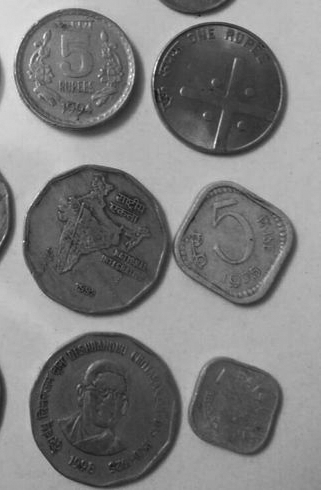

In [252]:
# 1A
monety_szare = cv2.imread('dane1-4/Monety_szare.bmp')
Image.fromarray(cv2.cvtColor(monety_szare, cv2.COLOR_BGR2RGB))

Rozwiązanie części 1A:

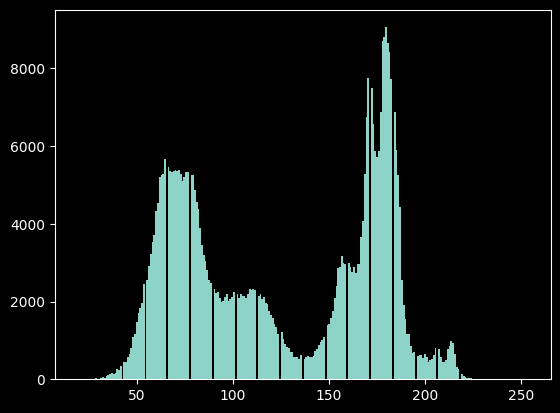

In [253]:
plt.hist(monety_szare.flatten(), bins=255);

In [254]:
monety_szare.shape

(490, 321, 3)

In [255]:
monety_szare = cv2.cvtColor(monety_szare, cv2.COLOR_BGR2GRAY)
monety_szare.shape

(490, 321)

In [256]:
thresholds = [60, 100, 120, 140, 160, 180, 200, 255]
binary_images = []

for threshold in thresholds:
    _, binary = cv2.threshold(monety_szare, threshold, 255, cv2.THRESH_BINARY_INV)
    binary_images.append(binary)

ret_otsu, binary_otsu = cv2.threshold(monety_szare, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
print(f"Optymalna wartość progu (Otsu): {ret_otsu}")

Optymalna wartość progu (Otsu): 127.0


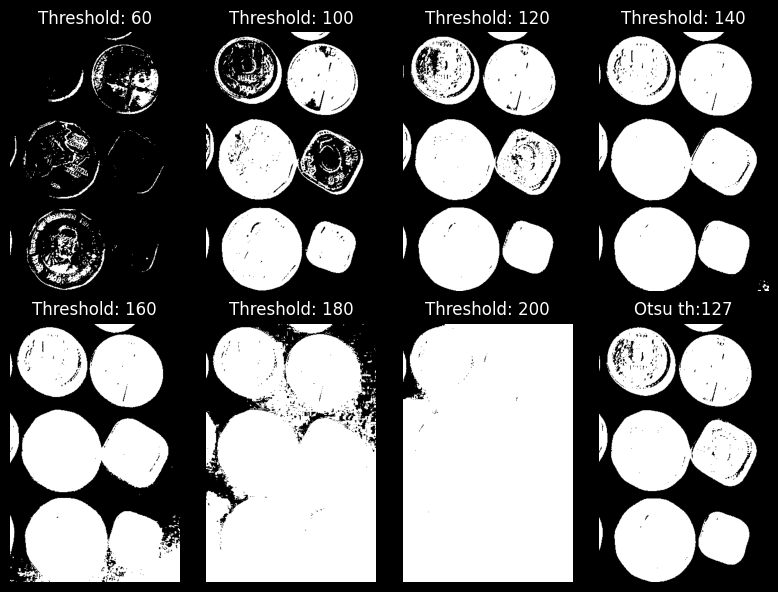

In [257]:
fig, axs = plt.subplots(2, 4, figsize=(8, 6))
for i, ax in enumerate(axs.flat):
    ax.imshow(binary_images[i], cmap='gray')
    ax.set_title(f'Threshold: {thresholds[i]}')
    ax.axis('off')

axs[1,3].set_title(f'Otsu th:{int(ret_otsu)}')
axs[1, 3].imshow(binary_otsu, cmap='gray')
plt.tight_layout()
plt.show()

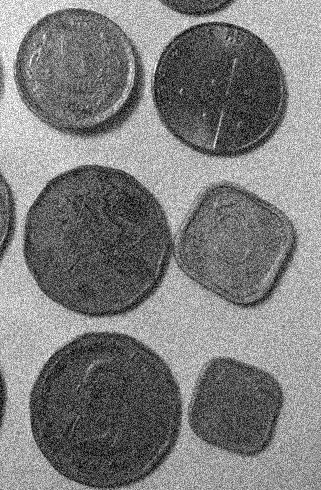

In [258]:
# 1B
monety_szare_szum = cv2.imread('dane1-4/Monety_szare_szum.bmp')
Image.fromarray(cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2RGB))

Rozwiązanie części 1B:


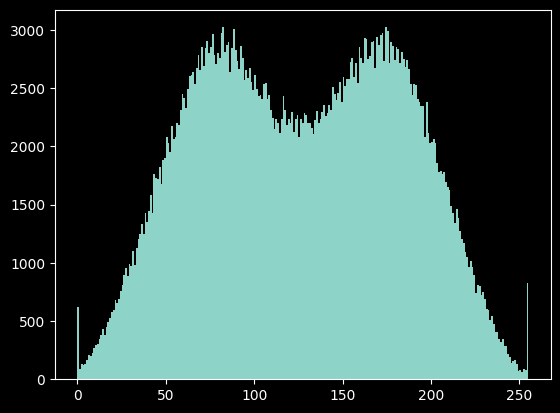

In [259]:
plt.hist(monety_szare_szum.flatten(), bins=255);

In [260]:
monety_szare_szum = cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2GRAY)
monety_szare_szum.shape

(490, 321)

In [261]:
gaussian_blur = cv2.GaussianBlur(monety_szare_szum, (5, 5), sigmaX=1)

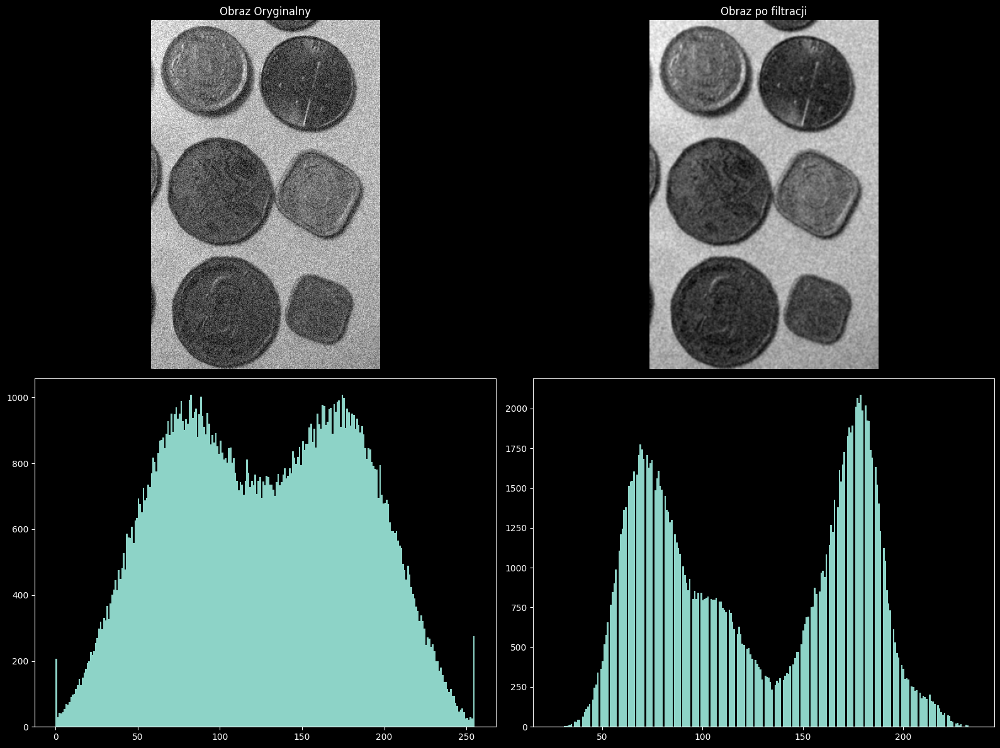

In [262]:
# Wywietlenie obrazów wraz z histogramami
fig, axs = plt.subplots(2, 2, figsize=(16, 12))
axs[0, 0].imshow(monety_szare_szum, cmap='gray')
axs[0, 0].set_title('Obraz Oryginalny')
axs[0, 0].axis('off')
axs[0, 1].imshow(gaussian_blur, cmap='gray')
axs[0, 1].set_title('Obraz po filtracji')
axs[0, 1].axis('off')
axs[1, 0].hist(monety_szare_szum.flatten(), bins=255)
axs[1, 1].hist(gaussian_blur.flatten(), bins=255)
plt.tight_layout()
plt.show()

In [263]:
threshold = 127
_, binary_grain = cv2.threshold(monety_szare_szum, threshold, 255, cv2.THRESH_BINARY_INV)

# Progowanie z użyciem Otsu na obrazie  
ret_otsu, binary_otsu_grain = cv2.threshold(monety_szare_szum, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
print(f"Optymalna wartość progu (Otsu): {ret_otsu}")

# Progowanie z użyciem Otsu na obrazie po zastosowaniu filtracji Gaussa
ret_otsu, binary_otsu_gaussian = cv2.threshold(gaussian_blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
print(f"Optymalna wartość progu (Otsu) po zastosowaniu filtracji Gaussa: {ret_otsu}")

Optymalna wartość progu (Otsu): 125.0
Optymalna wartość progu (Otsu) po zastosowaniu filtracji Gaussa: 127.0


In [264]:
thresholds = [100, 120, 140, 160, 180]
binary_monety_szum_images = []
binary_monety_gauss_images = []

for threshold in thresholds:
    _, binary = cv2.threshold(monety_szare_szum, threshold, 255, cv2.THRESH_BINARY_INV)
    binary_monety_szum_images.append(binary)

    _, binary = cv2.threshold(gaussian_blur, threshold, 255, cv2.THRESH_BINARY_INV)
    binary_monety_gauss_images.append(binary)

ret_otsu_szum, binary_szum_otsu = cv2.threshold(monety_szare_szum, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
binary_monety_szum_images.append(binary_szum_otsu)
print(f"Optymalna wartość progu szum (Otsu): {ret_otsu_szum}")

ret_otsu_gauss, binary_gauss_otsu = cv2.threshold(gaussian_blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
binary_monety_gauss_images.append(binary_gauss_otsu)
print(f"Optymalna wartość progu gauss (Otsu): {ret_otsu_gauss}")

Optymalna wartość progu szum (Otsu): 125.0
Optymalna wartość progu gauss (Otsu): 127.0


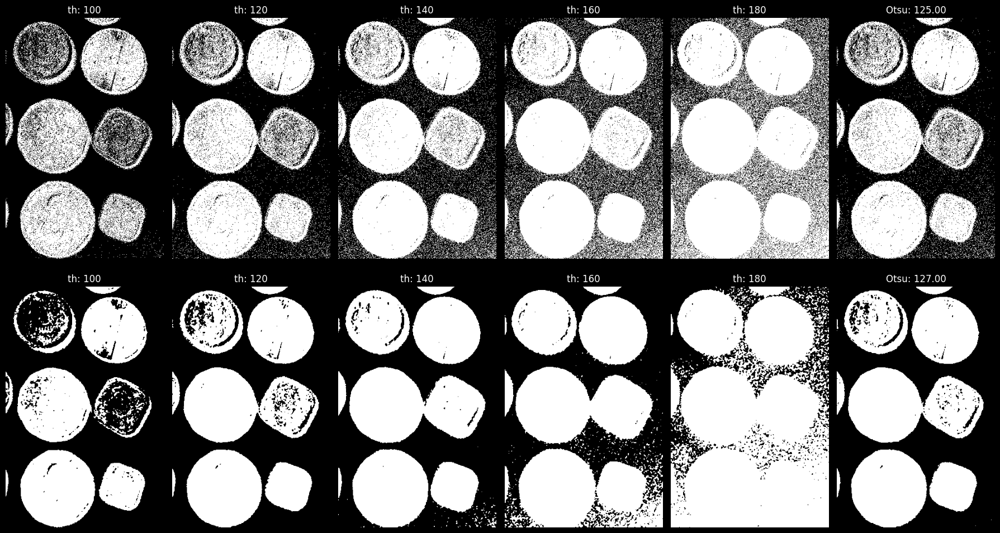

In [265]:
fig, axs = plt.subplots(2,6, figsize=(18, 10))

for i in range(6):
    axs[0,i].imshow(binary_monety_szum_images[i], cmap='gray')
    if i < 5:
        axs[0, i].set_title(f'th: {thresholds[i]}')
    else:
        axs[0, i].set_title(f'Otsu: {ret_otsu_szum:.2f}')
    axs[0, i].axis('off')

    axs[1,i].imshow(binary_monety_gauss_images[i], cmap='gray')
    if i < 5:
        axs[1, i].set_title(f'th: {thresholds[i]}')
    else:
        axs[1, i].set_title(f'Otsu: {ret_otsu_gauss:.2f}')
    axs[1, i].axis('off')

plt.tight_layout()
plt.show()

##### Zad. 2: Monety kolorowe

Na podobnej zasadzie dokonaj binaryzacji poniższych obrazów kolorowych. Skorzystaj z modelu barw HSV. Uzasadnij dobór progu w oparciu o histogram wybranej składowej.

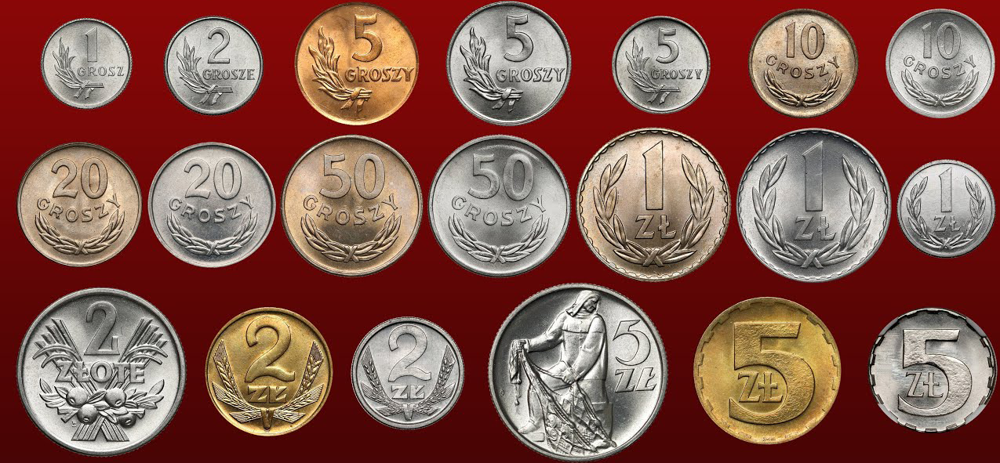

In [266]:
# 2A
monety_kolor = cv2.imread('dane1-4/Monety_kolor.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2RGB))

In [267]:
monety_hsv = cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(monety_hsv)

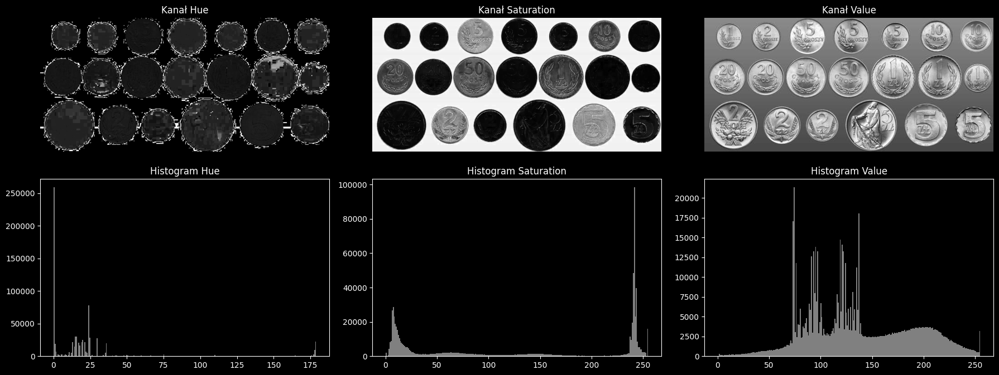

In [268]:
# Wyswietlenie obrazu w przestrzeniach h, s, v oraz histogramów poszczególnych kanałów
fig, axs = plt.subplots(2, 3, figsize=(18, 7))
axs[0, 0].imshow(h, cmap='gray')
axs[0, 0].set_title('Kanał Hue')
axs[0, 0].axis('off')
axs[0, 1].imshow(s, cmap='gray')
axs[0, 1].set_title('Kanał Saturation')
axs[0, 1].axis('off')
axs[0, 2].imshow(v, cmap='gray')
axs[0, 2].set_title('Kanał Value')
axs[0, 2].axis('off')
axs[1, 0].hist(h.ravel(), bins=256, color='gray')
axs[1, 0].set_title('Histogram Hue')
axs[1, 1].hist(s.ravel(), bins=256, color='gray')
axs[1, 1].set_title('Histogram Saturation')
axs[1, 2].hist(v.ravel(), bins=256, color='gray')
axs[1, 2].set_title('Histogram Value')
plt.tight_layout()
plt.show()

In [269]:
thresholds = [100, 150, 200, 220, 230, 240]
binary_images = []

for threshold in thresholds:
    _, binary = cv2.threshold(s, threshold, 255, cv2.THRESH_BINARY_INV)
    binary_images.append(binary)

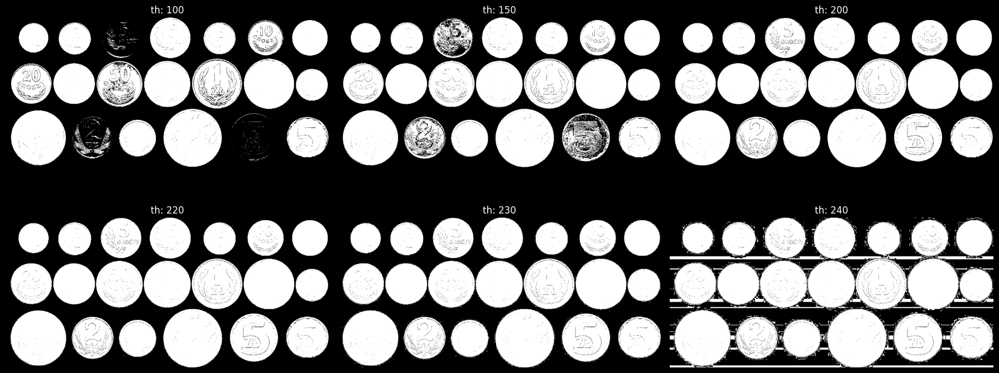

In [270]:
fig, axs = plt.subplots(2, 3, figsize=(18, 8))
for i, ax in enumerate(axs.flat):
    ax.imshow(binary_images[i], cmap='gray')
    ax.set_title(f'th: {thresholds[i]}')
    ax.axis('off')
plt.tight_layout()
plt.show()

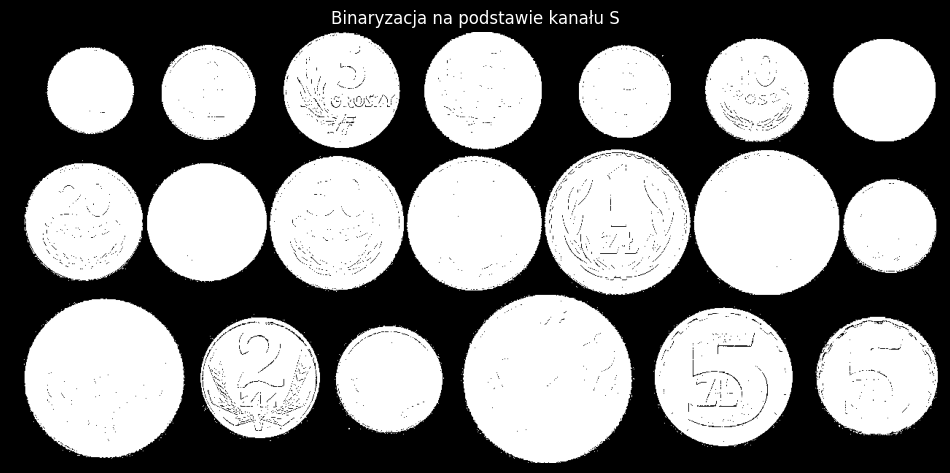

In [271]:
threshold = 220
_, binary_s = cv2.threshold(s, threshold, 255, cv2.THRESH_BINARY_INV)

plt.figure(figsize=(12,8))
plt.imshow(binary_s, cmap='gray')
plt.title('Binaryzacja na podstawie kanału S')
plt.axis('off')
plt.show()

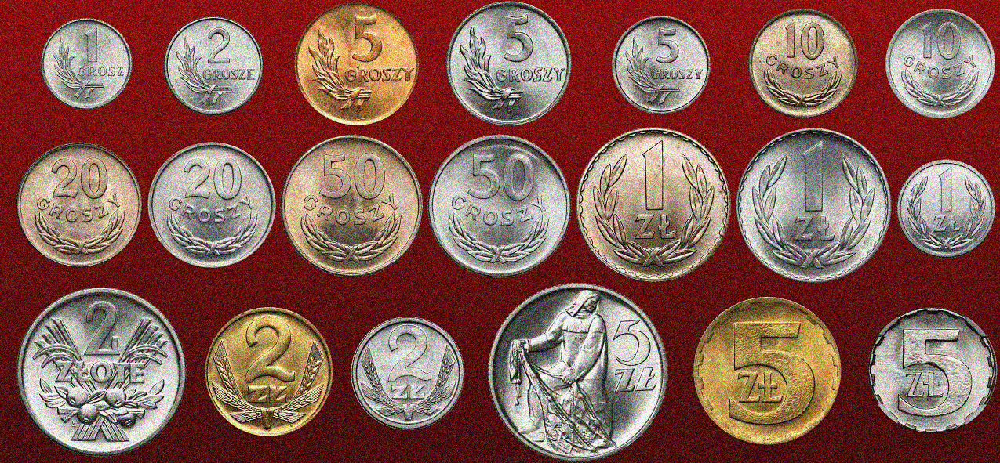

In [272]:
# 2B
monety_kolor_szum = cv2.imread('dane1-4/Monety_kolor_szum.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2RGB))

In [273]:
monety_kolor_szum_gaussian = cv2.GaussianBlur(monety_kolor_szum, (7, 7), sigmaX=1)

monety_szum_gauss_hsv = cv2.cvtColor(monety_kolor_szum_gaussian, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(monety_szum_gauss_hsv)

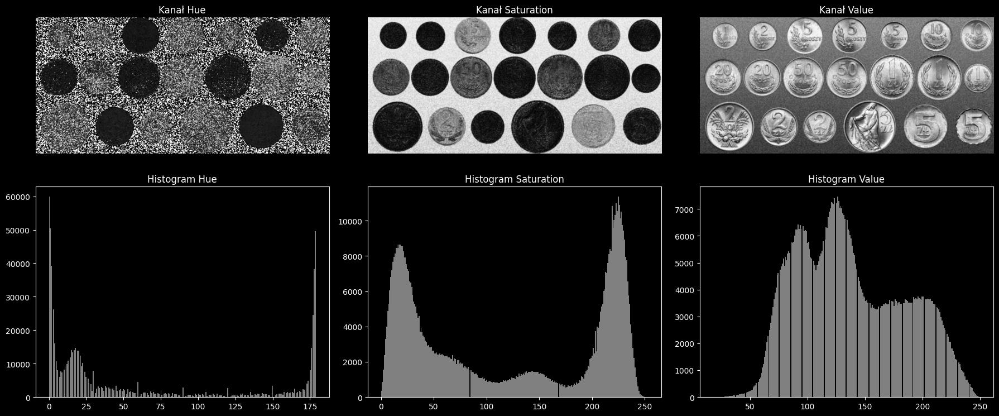

In [274]:
# Wyswietlenie obrazu w przestrzeniach h, s, v oraz histogramów poszczególnych kanałów
fig, axs = plt.subplots(2, 3, figsize=(18, 8))
axs[0, 0].imshow(h, cmap='gray')
axs[0, 0].set_title('Kanał Hue')
axs[0, 0].axis('off')
axs[0, 1].imshow(s, cmap='gray')
axs[0, 1].set_title('Kanał Saturation')
axs[0, 1].axis('off')
axs[0, 2].imshow(v, cmap='gray')
axs[0, 2].set_title('Kanał Value')
axs[0, 2].axis('off')
axs[1, 0].hist(h.ravel(), bins=256, color='gray')
axs[1, 0].set_title('Histogram Hue')
axs[1, 1].hist(s.ravel(), bins=256, color='gray')
axs[1, 1].set_title('Histogram Saturation')
axs[1, 2].hist(v.ravel(), bins=256, color='gray')
axs[1, 2].set_title('Histogram Value')
plt.tight_layout()
plt.show()

In [275]:
thresholds = [100, 150, 170, 180, 200, 220]
binary_images = []

for threshold in thresholds:
    _, binary = cv2.threshold(s, threshold, 255, cv2.THRESH_BINARY_INV)
    binary_images.append(binary)

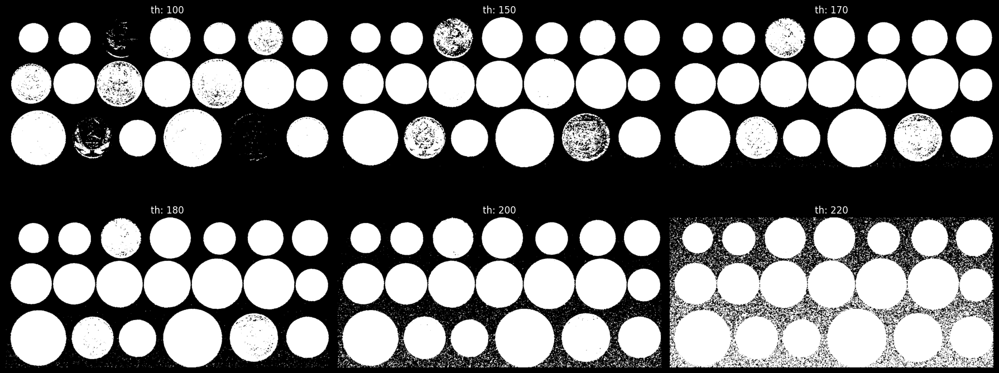

In [276]:
fig, axs = plt.subplots(2, 3, figsize=(18, 8))
for i, ax in enumerate(axs.flat):
    ax.imshow(binary_images[i], cmap='gray')
    ax.set_title(f'th: {thresholds[i]}')
    ax.axis('off')
plt.tight_layout()
plt.show()

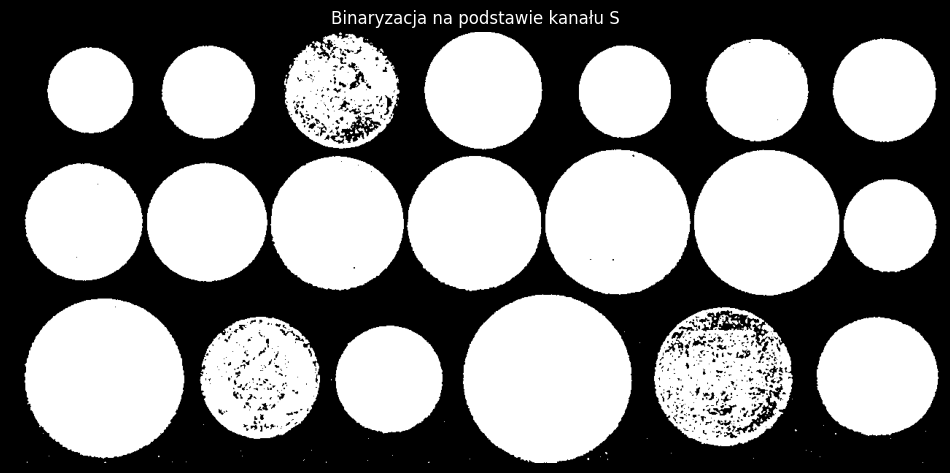

In [277]:
threshold = 160
_, binary_s = cv2.threshold(s, threshold, 255, cv2.THRESH_BINARY_INV)

plt.figure(figsize=(12,8))
plt.imshow(binary_s, cmap='gray')
plt.title('Binaryzacja na podstawie kanału S')
plt.axis('off')
plt.show()

##### Zad. 3: Tekst

W tym przypadku należy wyodrębnić litery od bardzo nierównomiernie oświetlonego tła. Skorzystaj z binaryzacji metodą Otsu. Zastosuj binaryzację w sposób lokalny (oknem przesuwnym). Jaki wpływ ma rozmiar okna na jakość binaryzacji? Jak przesuwać okno?

_(Pełna punktacja za zadanie wymaga własnoręcznej implementacji okna przesuwnego i filtracji wewnątrz niego. Użycie zamiast tego_ `cv2.adaptiveThreshold` _liczone jako pół zadania, przy założeniu zrozumienia tej metody.)_

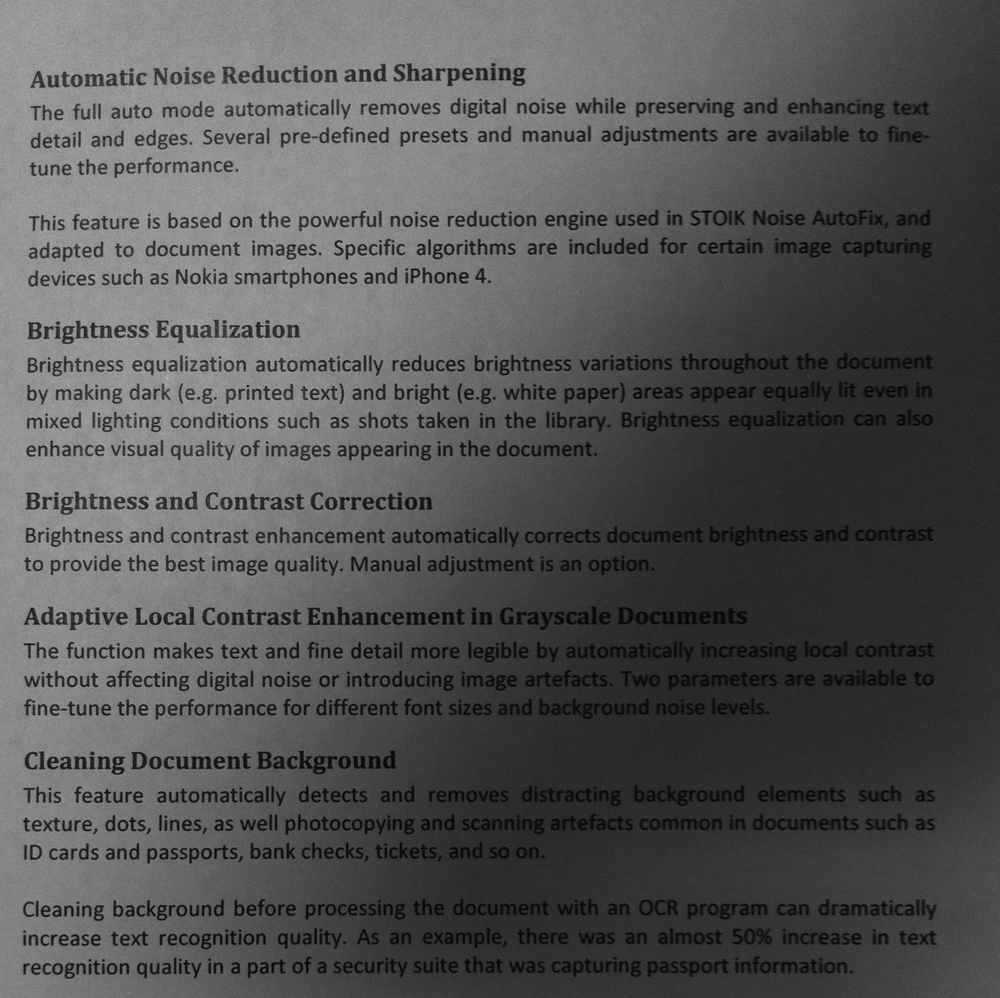

In [278]:
tekst = cv2.imread('dane1-4/Tekst1.bmp')
Image.fromarray(cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY))

Rozwiązanie:

In [279]:
tekst = cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY)

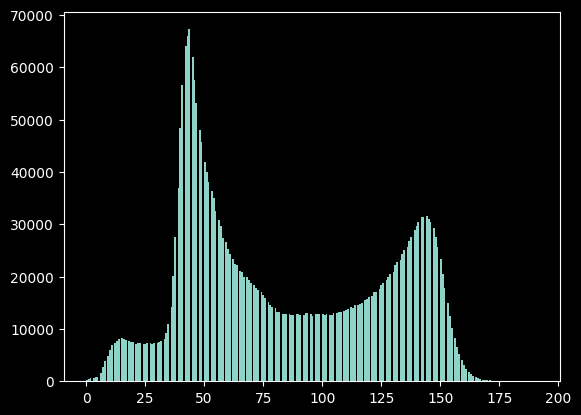

In [280]:
plt.hist(tekst.flatten(), bins=256);

In [281]:
def local_otsu_threshold(img, kernel, stride):
  thresh_img = np.zeros_like(img, dtype=np.uint8)
  img_h, img_w = img.shape

  for h in range(0, img_h - kernel + 1, stride):
    for w in range(0, img_w - kernel + 1, stride):
      
      window = img[h:h + kernel, w:w + kernel]

      T, thresh_img_window = cv2.threshold(window, 0, 255, cv2.THRESH_OTSU + cv2.THRESH_BINARY_INV)
      
      thresh_img[h:h + kernel, w:w + kernel] = thresh_img_window
  
  return thresh_img

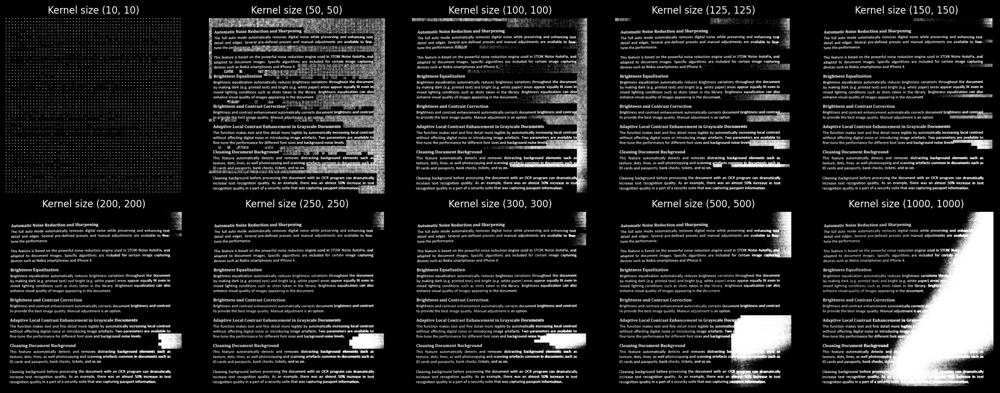

In [282]:
fig, axs = plt.subplots(2, 5, figsize=(18, 7))
axs = axs.flatten()

kernel_sizes = [10, 50, 100, 125, 150, 200, 250, 300, 500, 1000]
stride = 30
i = 0

for kernel in kernel_sizes:
    res = local_otsu_threshold(tekst, kernel, stride)
    axs[i].imshow(res, cmap="gray")
    axs[i].set_title(f"Kernel size ({kernel}, {kernel})")
    axs[i].axis('off')
    i += 1

plt.tight_layout()
plt.show()

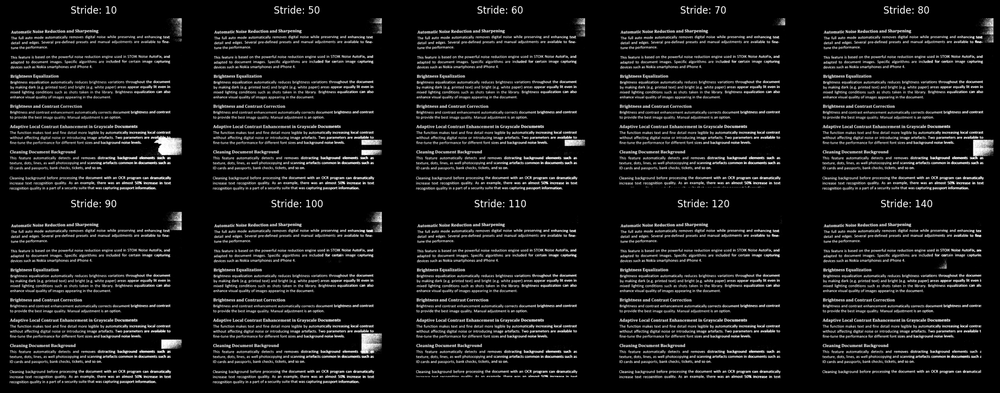

In [283]:
fig, axs = plt.subplots(2, 5, figsize=(18, 7))
axs = axs.flatten()

strides = [10, 50, 60, 70, 80, 90, 100, 110, 120, 140]
kernel = 200
i = 0

for stride in strides:
    res = local_otsu_threshold(tekst, kernel, stride)
    axs[i].imshow(res, cmap="gray")
    axs[i].set_title(f"Stride: {stride}")
    axs[i].axis('off')
    i += 1

plt.tight_layout()
plt.show()

In [284]:
binary_sliding = local_otsu_threshold(tekst, 200, 120)

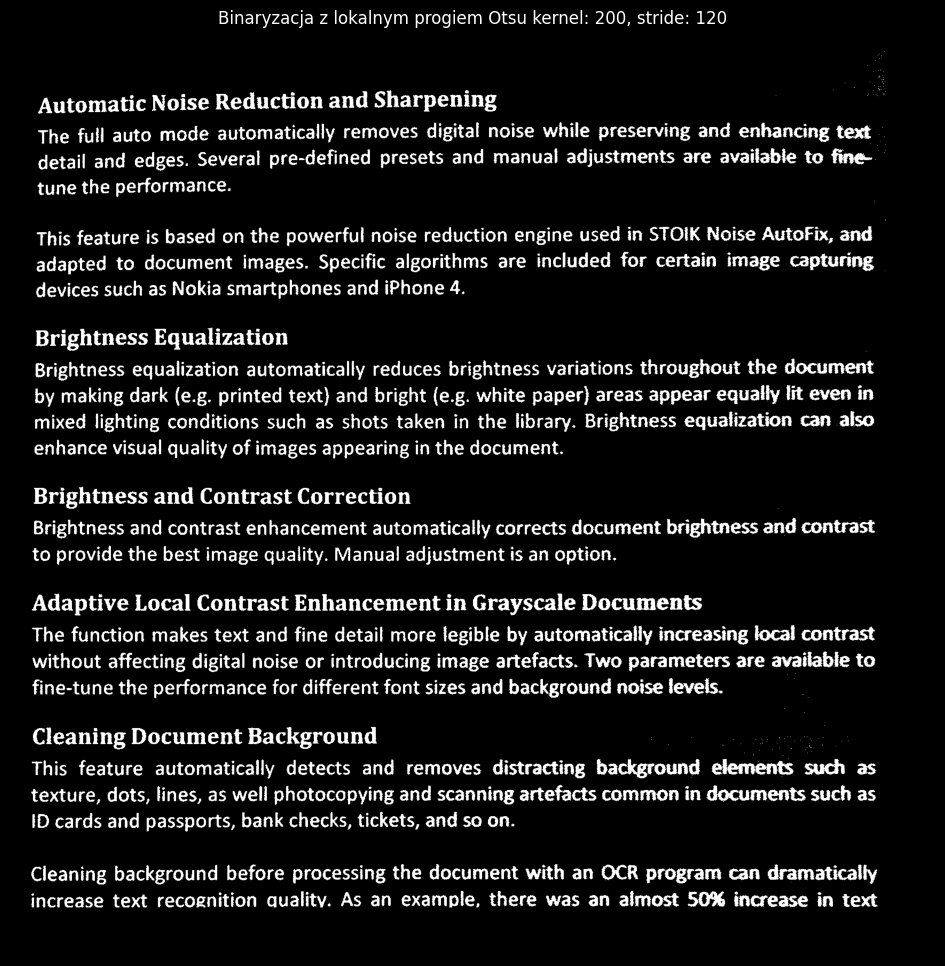

In [285]:
# Wyświetlenie finalnego wyniku
plt.figure(figsize=(12,12))
plt.imshow(binary_sliding, cmap='gray')
plt.title('Binaryzacja z lokalnym progiem Otsu kernel: 200, stride: 120')
plt.axis('off')
plt.show()

In [289]:
binary_adaptive = cv2.adaptiveThreshold(tekst, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 25, 10)

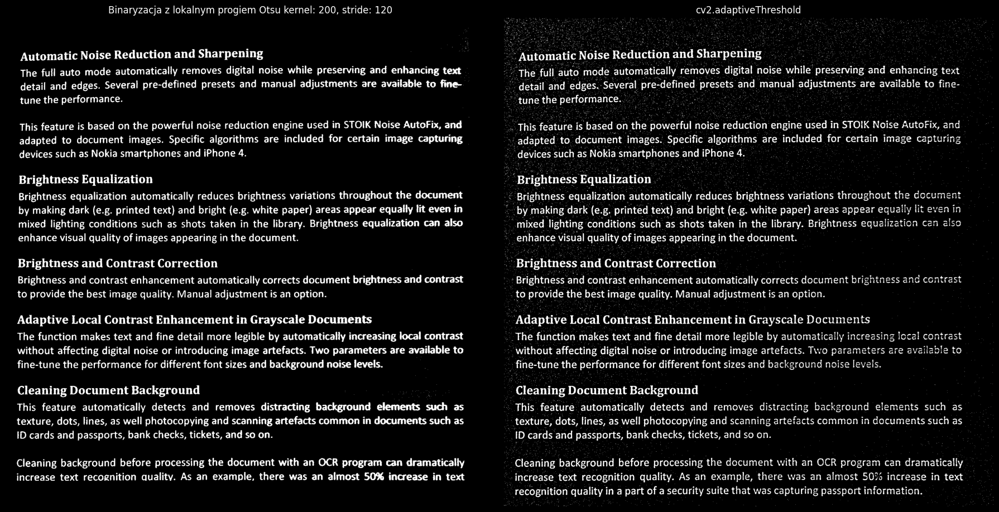

In [290]:
# Prównanie wyników z cv2.adaptiveThreshold
fig, axs = plt.subplots(1, 2, figsize=(18, 12))
axs[0].imshow(binary_sliding, cmap='gray')
axs[0].set_title('Binaryzacja z lokalnym progiem Otsu kernel: 200, stride: 120')
axs[0].axis('off')
axs[1].imshow(binary_adaptive, cmap='gray')
axs[1].set_title('cv2.adaptiveThreshold')
axs[1].axis('off')
plt.tight_layout()
plt.show()